In [1]:
!pip install torch pytorch-lightning pytorch_forecasting torchaudio torchdata torchtext torchvision optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 115.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 97.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 108.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.0/823.0 kB 61.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 197.7/197.7 kB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
from pytorch_forecasting import Baseline, TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.data import GroupNormalizer, NaNLabelEncoder
from pytorch_forecasting.metrics import SMAPE, PoissonLoss, QuantileLoss
#from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters
from lightning.pytorch.loggers import TensorBoardLogger
import random
import gc
import torch
from matplotlib import pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd
#import pytorch_lightning as pl
import lightning.pytorch as pl
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
import seaborn as sns

In [3]:
# version of pytorch forecasting
import pytorch_forecasting as py
print(f"pytorch-forecasting version: {py.__version__}")

pytorch-forecasting version: 1.3.0


In [5]:
df = pd.read_csv('records_per_visit_ohe3.csv')
df.head(4)

,HADM_ID,SUBJECT_ID,GENDER,DOB,DATE,INFECTIOUS_PARASITIC_DISEASES,NEOPLASMS,ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES,BLOOD_BLOOD_FORMING_ORGANS,MENTAL_DISORDERS,...,RESPIRATORY_SYSTEM,DIGESTIVE_SYSTEM,GENITOURINARY_SYSTEM,PREGNANCY_CHILD_BIRTH_PUERPERIUM,SKIN_SUBCUTANEOUS_TISSUE,MUSCULOSKELETAL_CONNECTIVE_TISSUE,CONGENITAL_ANOMALIES,PERINATAL_PERIOD,SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS,INJURY_POISONING
0,182104,36,M,1930-04-20,2000-01-01,0,0,0,0,1,...,1,1,1,0,0,0,0,0,0,0
1,122659,36,M,1930-04-20,2000-01-12,0,0,0,0,0,...,1,1,1,0,0,0,0,0,0,1
2,165660,36,M,1930-04-20,2003-01-10,0,0,0,0,1,...,1,1,1,0,0,0,0,0,0,1
3,174486,357,M,1937-04-15,2000-01-01,0,0,1,1,0,...,1,1,0,0,0,0,0,0,1,0


# Data Analysis

In [6]:
# change the 'Date' column to the datetime format
df['DATE'] = pd.to_datetime(df['DATE'],format="%Y-%m-%d" )

# sort the dataframe by date
df = df.sort_values(by='DATE')

# set the index to the date column, make sure its in the datetime format
df = df.set_index('DATE')

In [7]:
df.head(4)

,HADM_ID,SUBJECT_ID,GENDER,DOB,INFECTIOUS_PARASITIC_DISEASES,NEOPLASMS,ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES,BLOOD_BLOOD_FORMING_ORGANS,MENTAL_DISORDERS,NERVOUS_SYSTEM_SENSE_ORGANS,...,RESPIRATORY_SYSTEM,DIGESTIVE_SYSTEM,GENITOURINARY_SYSTEM,PREGNANCY_CHILD_BIRTH_PUERPERIUM,SKIN_SUBCUTANEOUS_TISSUE,MUSCULOSKELETAL_CONNECTIVE_TISSUE,CONGENITAL_ANOMALIES,PERINATAL_PERIOD,SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS,INJURY_POISONING
DATE,,,,,,,,,,,,,,,,,,,,,
2000-01-01,182104,36,M,1930-04-20,0,0,0,0,1,0,...,1,1,1,0,0,0,0,0,0,0
2000-01-01,116509,32367,M,1935-04-01,0,0,1,0,1,1,...,0,0,0,0,0,1,0,0,0,1
2000-01-01,116193,31470,M,1910-01-01,0,0,1,1,0,0,...,0,0,0,0,0,1,0,0,0,1
2000-01-01,176493,30915,F,1955-07-17,1,0,1,0,0,1,...,0,0,1,0,1,1,0,0,1,1


# Building TimeSeriesDataSet for TFT

# **Goal : To predict next visit ICD code(s)**


**Building time_idx:  Creating  a new integer column time_idx for each row within each patient's admissions data, representing the sequential order of the data points for that patient**

In [8]:
df= df.reset_index()
df_tft = df.sort_values(by=['SUBJECT_ID', 'DATE'])

df_tft['time_idx'] = df_tft.groupby(['SUBJECT_ID']).cumcount()
# If you want the index to start from 1 instead of 0
df_tft['time_idx'] = df_tft['time_idx'] + 1

**We want to predict next visit ICD code(s), hence Subject_ID column will be used for grouping the data and needs to be categorical. If groupid column in numeric then  convert it to a categorical column else you will encounter error**

In [9]:
df_tft['SUBJECT_ID']="SUBJECT_ID " + df_tft['SUBJECT_ID'].astype(str)

**Displaying** the time_idx for a few patients

In [10]:
df_tft.columns

Index(['DATE', 'HADM_ID', 'SUBJECT_ID', 'GENDER', 'DOB',
       'INFECTIOUS_PARASITIC_DISEASES', 'NEOPLASMS',
       'ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES',
       'BLOOD_BLOOD_FORMING_ORGANS', 'MENTAL_DISORDERS',
       'NERVOUS_SYSTEM_SENSE_ORGANS', 'CIRCULATORY_SYSTEM',
       'RESPIRATORY_SYSTEM', 'DIGESTIVE_SYSTEM', 'GENITOURINARY_SYSTEM',
       'PREGNANCY_CHILD_BIRTH_PUERPERIUM', 'SKIN_SUBCUTANEOUS_TISSUE',
       'MUSCULOSKELETAL_CONNECTIVE_TISSUE', 'CONGENITAL_ANOMALIES',
       'PERINATAL_PERIOD', 'SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS',
       'INJURY_POISONING', 'time_idx'],
      dtype='object')

In [11]:
# convert gender to boolean
df_tft['GENDER'] = df_tft['GENDER'].astype(bool)

In [12]:
# convert DOB to a date and then to day, month, year
df_tft['DOB'] = pd.to_datetime(df_tft['DOB'],format="%Y-%m-%d" )
df_tft['Day'] = df_tft['DOB'].dt.day
df_tft['Month'] = df_tft['DOB'].dt.month
df_tft['Year'] = df_tft['DOB'].dt.year

In [13]:
# # convert date to timestamp

# Convert string to datetime
df_tft['DATE'] = pd.to_datetime(df_tft['DATE'])

# Convert datetime to Unix timestamp (in seconds)
df_tft['DATE'] = df_tft['DATE'].astype('int64') // 10**9  # now it's integer seconds

# Convert seconds to days
df_tft['DATE'] = df_tft['DATE'] / 86400  # Convert Unix timestamp from seconds to days

# Convert to float (required by TFT)
df_tft['DATE'] = df_tft['DATE'].astype(float)

In [14]:
# convert all icd columns to str type values only
# df_tft['ICD1']=df_tft['ICD1'].astype('str')
# df_tft['ICD2']=df_tft['ICD2'].astype('str')
# df_tft['ICD3']=df_tft['ICD3'].astype('str')

# 'INFECTIOUS_PARASITIC_DISEASES', 'NEOPLASMS', 'ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES', 'BLOOD_BLOOD_FORMING_ORGANS', 'MENTAL_DISORDERS', 'NERVOUS_SYSTEM_SENSE_ORGANS', 'CIRCULATORY_SYSTEM', 'RESPIRATORY_SYSTEM', 'DIGESTIVE_SYSTEM', 'GENITOURINARY_SYSTEM', 'PREGNANCY_CHILD_BIRTH_PUERPERIUM', 'SKIN_SUBCUTANEOUS_TISSUE', 'MUSCULOSKELETAL_CONNECTIVE_TISSUE', 'CONGENITAL_ANOMALIES', 'PERINATAL_PERIOD', 'SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS', 'INJURY_POISONING'
# convert the one hot encoding stuff to bool
df_tft['INFECTIOUS_PARASITIC_DISEASES'] = df_tft['INFECTIOUS_PARASITIC_DISEASES'].astype(bool)
df_tft['NEOPLASMS'] = df_tft['NEOPLASMS'].astype(bool)
df_tft['ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES'] = df_tft['ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES'].astype(bool)
df_tft['BLOOD_BLOOD_FORMING_ORGANS'] = df_tft['BLOOD_BLOOD_FORMING_ORGANS'].astype(bool)
df_tft['MENTAL_DISORDERS'] = df_tft['MENTAL_DISORDERS'].astype(bool)
df_tft['NERVOUS_SYSTEM_SENSE_ORGANS'] = df_tft['NERVOUS_SYSTEM_SENSE_ORGANS'].astype(bool)
df_tft['CIRCULATORY_SYSTEM'] = df_tft['CIRCULATORY_SYSTEM'].astype(bool)
df_tft['RESPIRATORY_SYSTEM'] = df_tft['RESPIRATORY_SYSTEM'].astype(bool)
df_tft['DIGESTIVE_SYSTEM'] = df_tft['DIGESTIVE_SYSTEM'].astype(bool)
df_tft['GENITOURINARY_SYSTEM'] = df_tft['GENITOURINARY_SYSTEM'].astype(bool)
df_tft['PREGNANCY_CHILD_BIRTH_PUERPERIUM'] = df_tft['PREGNANCY_CHILD_BIRTH_PUERPERIUM'].astype(bool)
df_tft['SKIN_SUBCUTANEOUS_TISSUE'] = df_tft['SKIN_SUBCUTANEOUS_TISSUE'].astype(bool)
df_tft['MUSCULOSKELETAL_CONNECTIVE_TISSUE'] = df_tft['MUSCULOSKELETAL_CONNECTIVE_TISSUE'].astype(bool)
df_tft['CONGENITAL_ANOMALIES'] = df_tft['CONGENITAL_ANOMALIES'].astype(bool)
df_tft['PERINATAL_PERIOD'] = df_tft['PERINATAL_PERIOD'].astype(bool)
df_tft['SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS'] = df_tft['SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS'].astype(bool)
df_tft['INJURY_POISONING'] = df_tft['INJURY_POISONING'].astype(bool)


In [15]:
# check the data type of a column
df_tft.dtypes

,0
DATE,float64
HADM_ID,int64
SUBJECT_ID,object
GENDER,bool
DOB,datetime64[ns]
INFECTIOUS_PARASITIC_DISEASES,bool
NEOPLASMS,bool
ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES,bool
BLOOD_BLOOD_FORMING_ORGANS,bool
MENTAL_DISORDERS,bool


In [16]:
df_test=df_tft
#  [['time_idx','Date','Store', 'Dept','Temperature', 'Fuel_Price','CPI', 'Unemployment','IsHoliday', 'Type', 'Size',  'Weekly_Sales' ]]
target_stores = ['SUBJECT_ID 109', 'SUBJECT_ID 36', 'SUBJECT_ID 22921']

# Filter for rows where the `time_idx` is the same for the target stores
filtered_df = df_test[df_test['SUBJECT_ID'].isin(target_stores)]

# Group by `time_idx` and check if any group has more than 2 unique stores
grouped_df = filtered_df.groupby('time_idx')['SUBJECT_ID'].nunique()
same_time_idx = grouped_df[grouped_df > 2].index.tolist()

same_time_idx=[1,2,3,4,5,6]

# Filter for rows with the identified `time_idx` values
result_df = filtered_df[filtered_df['time_idx'].isin(same_time_idx)]
result_df

,DATE,HADM_ID,SUBJECT_ID,GENDER,DOB,INFECTIOUS_PARASITIC_DISEASES,NEOPLASMS,ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES,BLOOD_BLOOD_FORMING_ORGANS,MENTAL_DISORDERS,...,SKIN_SUBCUTANEOUS_TISSUE,MUSCULOSKELETAL_CONNECTIVE_TISSUE,CONGENITAL_ANOMALIES,PERINATAL_PERIOD,SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS,INJURY_POISONING,time_idx,Day,Month,Year
0,10957.0,182104,SUBJECT_ID 36,True,1930-04-20,False,False,False,False,True,...,False,False,False,False,False,False,1,20,4,1930
2406,10968.0,122659,SUBJECT_ID 36,True,1930-04-20,False,False,False,False,False,...,False,False,False,False,False,True,2,20,4,1930
7049,12062.0,165660,SUBJECT_ID 36,True,1930-04-20,False,False,False,False,True,...,False,False,False,False,False,True,3,20,4,1930
1029,10957.0,119313,SUBJECT_ID 22921,True,1949-12-23,False,False,False,False,True,...,False,False,False,False,False,True,1,23,12,1949
8807,14184.0,127403,SUBJECT_ID 22921,True,1949-12-23,False,False,True,False,True,...,False,False,False,False,False,False,2,23,12,1949
8855,14410.0,103590,SUBJECT_ID 22921,True,1949-12-23,False,False,False,False,True,...,False,False,False,False,True,False,3,23,12,1949
8874,14512.0,128083,SUBJECT_ID 22921,True,1949-12-23,False,False,False,False,True,...,False,False,False,False,False,False,4,23,12,1949
8878,14527.0,135037,SUBJECT_ID 22921,True,1949-12-23,False,False,False,False,True,...,False,False,False,False,False,False,5,23,12,1949


# TimeSeriesDataSet for TFT

In [17]:
train_cnt=int(len(df_tft)*.7)
#train_cnt=150
train = df_tft.iloc[:train_cnt]
test = df_tft.iloc[train_cnt:]

max_prediction_length = 1   #
max_encoder_length = 10     # 365
min_encoder_length = max_prediction_length

In [18]:
#  create TFT TimeSeriesDataset
training = TimeSeriesDataSet(
    train[: train_cnt],
    time_idx="time_idx",
    target=['INFECTIOUS_PARASITIC_DISEASES', 'NEOPLASMS', 'ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES', 'BLOOD_BLOOD_FORMING_ORGANS', 'MENTAL_DISORDERS', 'NERVOUS_SYSTEM_SENSE_ORGANS', 'CIRCULATORY_SYSTEM', 'RESPIRATORY_SYSTEM', 'DIGESTIVE_SYSTEM', 'GENITOURINARY_SYSTEM', 'PREGNANCY_CHILD_BIRTH_PUERPERIUM', 'SKIN_SUBCUTANEOUS_TISSUE', 'MUSCULOSKELETAL_CONNECTIVE_TISSUE', 'CONGENITAL_ANOMALIES', 'PERINATAL_PERIOD', 'SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS', 'INJURY_POISONING'],
    group_ids=[ "SUBJECT_ID"],
    min_encoder_length=min_encoder_length,
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    static_categoricals=["SUBJECT_ID"],
    static_reals=['Day','Month', 'Year', 'GENDER'],
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=['DATE', 'INFECTIOUS_PARASITIC_DISEASES', 'NEOPLASMS', 'ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES', 'BLOOD_BLOOD_FORMING_ORGANS', 'MENTAL_DISORDERS', 'NERVOUS_SYSTEM_SENSE_ORGANS', 'CIRCULATORY_SYSTEM', 'RESPIRATORY_SYSTEM', 'DIGESTIVE_SYSTEM', 'GENITOURINARY_SYSTEM', 'PREGNANCY_CHILD_BIRTH_PUERPERIUM', 'SKIN_SUBCUTANEOUS_TISSUE', 'MUSCULOSKELETAL_CONNECTIVE_TISSUE', 'CONGENITAL_ANOMALIES', 'PERINATAL_PERIOD', 'SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS', 'INJURY_POISONING'],
    # time_varying_unknown_reals=['DATE'],
    # time_varying_unknown_categoricals=['ICD1', 'ICD2', 'ICD3'],

    # target_normalizer=GroupNormalizer(
    #     groups=[ "SUBJECT_ID"], transformation="softplus"
    # ),   #use softplus and normalize by group
    # target_normalizer=MultiNormalizer(),  # Use the NaNLabelEncoder to encode categorical target

    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
    allow_missing_timesteps=True
)

# create validation set (predict=True) which means to predict the last max_prediction_length points in time
# for each series
validation = TimeSeriesDataSet.from_dataset(training, train, predict=True, stop_randomization=True)

# create dataloaders for model
batch_size = 32  # set this between 32 to 128
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=8)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=8)


/usr/local/lib/python3.11/dist-packages/pytorch_forecasting/data/timeseries.py:951: UserWarning: Target scales will be only added for continous targets
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [19]:
# my code to get y from val_dataloader (so that I can later compare with predictions)


# Fetch one batch from the validation dataloader
batch = next(iter(val_dataloader))

# `x` contains input features, `y` contains target values (actual timestamps)
x, y = batch

print(f"Keys in x: {x.keys()}")  # Inspect available input features
print(f"Type of y: {type(y)}")    # Check if y is a tuple
print(f"Length of y: {len(y)}")   # Check the structure of y if it's a tuple

# Extract actual timestamps
actual_dates = y[0][0]  # The first element of y is the target (timestamps)
print(f"Shape of actual_dates: {actual_dates.shape}")
print(f"Sample values: {actual_dates[:5]}")

# number of records in val dataloader
print(f"Number of records in val dataloader: {len(x['decoder_target'])}")


Keys in x: dict_keys(['encoder_cat', 'encoder_cont', 'encoder_target', 'encoder_lengths', 'decoder_cat', 'decoder_cont', 'decoder_target', 'decoder_lengths', 'decoder_time_idx', 'groups', 'target_scale'])
Type of y: <class 'tuple'>
Length of y: 2
Shape of actual_dates: torch.Size([320, 1])
Sample values: tensor([[0],
        [1],
        [1],
        [1],
        [1]])
Number of records in val dataloader: 17


# HyperParameter Tuning for TFT

In [ ]:
import optuna
#from pytorch_lightning import Trainer
from torchmetrics import MeanAbsoluteError, MeanSquaredError
#from pytorch_forecasting import TemporalFusionTransformer
from lightning.pytorch.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_forecasting.metrics import CrossEntropy, MultiLoss


def objective(trial):
    # Defone Hyperparameters
    hidden_size = trial.suggest_int("hidden_size", 4, 8)
    lstm_layers = trial.suggest_int("lstm_layers", 1,4)
    dropout = trial.suggest_float("dropout",  0.5, 0.7)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-2)

    #optimizer=trial.suggest_categorical("optimizer", ["Adam", "AdamW"])
    attention_head_size=trial.suggest_int("attention_head_size", 1,2)
    #hidden_continuous_size=trial.suggest_int("hidden_continuous_size",1,2)
    #loss=trial.suggest_categorical("loss", ["MSELoss", "PoissonLoss", "QuantileLoss"])
    #reduce_on_plateau_patience=trial.suggest_int("reduce_on_plateau_patience", 1,2)


    # create the TFT Model with suggest HP
    tft = TemporalFusionTransformer.from_dataset(
        training,
        learning_rate=learning_rate,
        hidden_size=hidden_size,
        lstm_layers=lstm_layers,
        dropout=dropout,
        hidden_continuous_size=1,
        attention_head_size=attention_head_size,
        # loss=QuantileLoss(),
        # loss=CrossEntropy(),                            # FOR CLASSIFICATION
        loss=MultiLoss(metrics=[CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy()]),                            # FOR MULTI LABEL CLASSIFICATION
        optimizer="AdamW",
        reduce_on_plateau_patience=1,

    )
    early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
    lr_logger = LearningRateMonitor()  # log the learning rate
    logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

    # Train the Model
    trainer = pl.Trainer(
    max_epochs=30,
    accelerator="gpu",
    #enable_model_summary=True,
    gradient_clip_val=0.5,
    limit_train_batches=100,  # coment in for training, running valiation every 30 batches
    #fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
    )

    trainer.fit(
        tft,
        train_dataloaders=train_dataloader,
        val_dataloaders=val_dataloader
    )


    #Evaluate the Model
    val_loss= trainer.callback_metrics['val_loss'].item()
    return val_loss


In [ ]:
# Create a Study and specify the direction of optimization
study = optuna.create_study(direction="minimize")
# Optimize the objective function
study.optimize(objective, n_trials=30)
print(f"Best Hyperparameters: {study.best_params}")

[I 2025-04-19 07:10:11,692] A new study created in memory with name: no-name-26237c92-ecfd-470d-969d-06ec857688e3
<ipython-input-26-bde5189b76a0>:14: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-2)
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
INFO:pytorch_lightning.utilities.

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 07:21:40,067] Trial 0 finished with value: 8.566439628601074 and parameters: {'hidden_size': 4, 'lstm_layers': 4, 'dropout': 0.5053182561957164, 'learning_rate': 0.0004095445947494477, 'attention_head_size': 2}. Best is trial 0 with value: 8.566439628601074.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | P

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 07:32:51,569] Trial 1 finished with value: 7.97603702545166 and parameters: {'hidden_size': 4, 'lstm_layers': 1, 'dropout': 0.6503013184759632, 'learning_rate': 0.0022601724819640485, 'attention_head_size': 2}. Best is trial 1 with value: 7.97603702545166.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Par

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 07:44:16,058] Trial 2 finished with value: 8.539034843444824 and parameters: {'hidden_size': 5, 'lstm_layers': 3, 'dropout': 0.5707153913660148, 'learning_rate': 0.0002782412361433558, 'attention_head_size': 2}. Best is trial 1 with value: 7.97603702545166.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Pa

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 07:56:10,955] Trial 3 finished with value: 8.545010566711426 and parameters: {'hidden_size': 4, 'lstm_layers': 3, 'dropout': 0.5641166910041236, 'learning_rate': 0.000572623714422431, 'attention_head_size': 1}. Best is trial 1 with value: 7.97603702545166.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Par

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 08:07:42,916] Trial 4 finished with value: 8.55756664276123 and parameters: {'hidden_size': 6, 'lstm_layers': 3, 'dropout': 0.5744453619222886, 'learning_rate': 0.00017036581218140252, 'attention_head_size': 2}. Best is trial 1 with value: 7.97603702545166.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Pa

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 08:19:20,911] Trial 5 finished with value: 7.717566013336182 and parameters: {'hidden_size': 4, 'lstm_layers': 2, 'dropout': 0.5863453444266088, 'learning_rate': 0.005901943284408192, 'attention_head_size': 1}. Best is trial 5 with value: 7.717566013336182.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Pa

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 08:30:57,463] Trial 6 finished with value: 8.340937614440918 and parameters: {'hidden_size': 7, 'lstm_layers': 2, 'dropout': 0.6914452949840922, 'learning_rate': 0.003999746038929358, 'attention_head_size': 1}. Best is trial 5 with value: 7.717566013336182.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Pa

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 08:42:31,523] Trial 7 finished with value: 8.647480010986328 and parameters: {'hidden_size': 4, 'lstm_layers': 3, 'dropout': 0.5198074392220386, 'learning_rate': 0.00014462630565236447, 'attention_head_size': 1}. Best is trial 5 with value: 7.717566013336182.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 08:54:00,277] Trial 8 finished with value: 8.293599128723145 and parameters: {'hidden_size': 6, 'lstm_layers': 3, 'dropout': 0.6116126554780803, 'learning_rate': 0.009954043716842702, 'attention_head_size': 2}. Best is trial 5 with value: 7.717566013336182.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Pa

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 09:05:44,340] Trial 9 finished with value: 8.014010429382324 and parameters: {'hidden_size': 5, 'lstm_layers': 4, 'dropout': 0.6520718796744812, 'learning_rate': 0.0025955019629415074, 'attention_head_size': 1}. Best is trial 5 with value: 7.717566013336182.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | P

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 09:17:22,904] Trial 10 finished with value: 8.20899772644043 and parameters: {'hidden_size': 8, 'lstm_layers': 1, 'dropout': 0.6353763602796705, 'learning_rate': 0.009853567191680778, 'attention_head_size': 1}. Best is trial 5 with value: 7.717566013336182.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Pa

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 09:29:00,032] Trial 11 finished with value: 8.086836814880371 and parameters: {'hidden_size': 5, 'lstm_layers': 1, 'dropout': 0.6749633793358925, 'learning_rate': 0.001804303239041337, 'attention_head_size': 2}. Best is trial 5 with value: 7.717566013336182.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | P

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 09:40:41,723] Trial 12 finished with value: 8.262325286865234 and parameters: {'hidden_size': 4, 'lstm_layers': 2, 'dropout': 0.6165295545928428, 'learning_rate': 0.001114002000542412, 'attention_head_size': 1}. Best is trial 5 with value: 7.717566013336182.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | P

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 09:52:29,033] Trial 13 finished with value: 8.062257766723633 and parameters: {'hidden_size': 5, 'lstm_layers': 1, 'dropout': 0.6605379590199076, 'learning_rate': 0.0038923777063645283, 'attention_head_size': 2}. Best is trial 5 with value: 7.717566013336182.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 10:04:16,378] Trial 14 finished with value: 7.831689357757568 and parameters: {'hidden_size': 7, 'lstm_layers': 2, 'dropout': 0.5960085833817281, 'learning_rate': 0.005139779851631433, 'attention_head_size': 1}. Best is trial 5 with value: 7.717566013336182.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | P

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 10:15:41,965] Trial 15 finished with value: 8.154754638671875 and parameters: {'hidden_size': 7, 'lstm_layers': 2, 'dropout': 0.5416655992016939, 'learning_rate': 0.005513403522187465, 'attention_head_size': 1}. Best is trial 5 with value: 7.717566013336182.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | P

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 10:27:15,101] Trial 16 finished with value: 8.353571891784668 and parameters: {'hidden_size': 8, 'lstm_layers': 2, 'dropout': 0.5908490662962894, 'learning_rate': 0.001336434196219923, 'attention_head_size': 1}. Best is trial 5 with value: 7.717566013336182.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | P

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 10:38:43,505] Trial 17 finished with value: 7.643642425537109 and parameters: {'hidden_size': 7, 'lstm_layers': 2, 'dropout': 0.5905002921593716, 'learning_rate': 0.005836585232978273, 'attention_head_size': 1}. Best is trial 17 with value: 7.643642425537109.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 10:50:18,846] Trial 18 finished with value: 7.983438014984131 and parameters: {'hidden_size': 7, 'lstm_layers': 2, 'dropout': 0.6215052196071796, 'learning_rate': 0.006544056325338679, 'attention_head_size': 1}. Best is trial 17 with value: 7.643642425537109.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 11:02:00,272] Trial 19 finished with value: 8.192998886108398 and parameters: {'hidden_size': 6, 'lstm_layers': 1, 'dropout': 0.5498740750374652, 'learning_rate': 0.0006033005544560469, 'attention_head_size': 1}. Best is trial 17 with value: 7.643642425537109.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 11:13:36,476] Trial 20 finished with value: 7.818634986877441 and parameters: {'hidden_size': 8, 'lstm_layers': 2, 'dropout': 0.5881868488177748, 'learning_rate': 0.0026781985230037455, 'attention_head_size': 1}. Best is trial 17 with value: 7.643642425537109.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 11:25:23,006] Trial 21 finished with value: 7.567925453186035 and parameters: {'hidden_size': 8, 'lstm_layers': 2, 'dropout': 0.5863633327014831, 'learning_rate': 0.0031779249511060914, 'attention_head_size': 1}. Best is trial 21 with value: 7.567925453186035.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 11:37:02,793] Trial 22 finished with value: 8.21174430847168 and parameters: {'hidden_size': 8, 'lstm_layers': 2, 'dropout': 0.5446566284050446, 'learning_rate': 0.0069894116014270705, 'attention_head_size': 1}. Best is trial 21 with value: 7.567925453186035.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 11:48:39,702] Trial 23 finished with value: 7.62945032119751 and parameters: {'hidden_size': 7, 'lstm_layers': 2, 'dropout': 0.5821045422695992, 'learning_rate': 0.003792883959018899, 'attention_head_size': 1}. Best is trial 21 with value: 7.567925453186035.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | P

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 12:00:25,445] Trial 24 finished with value: 7.794677734375 and parameters: {'hidden_size': 7, 'lstm_layers': 3, 'dropout': 0.6064027170473131, 'learning_rate': 0.0033841650411824587, 'attention_head_size': 1}. Best is trial 21 with value: 7.567925453186035.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Pa

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 12:12:08,724] Trial 25 finished with value: 8.010612487792969 and parameters: {'hidden_size': 8, 'lstm_layers': 2, 'dropout': 0.6321903289621028, 'learning_rate': 0.0016270739607973559, 'attention_head_size': 1}. Best is trial 21 with value: 7.567925453186035.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 12:23:59,074] Trial 26 finished with value: 8.212355613708496 and parameters: {'hidden_size': 7, 'lstm_layers': 1, 'dropout': 0.5584123739212181, 'learning_rate': 0.0008377713103612305, 'attention_head_size': 1}. Best is trial 21 with value: 7.567925453186035.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 12:35:58,996] Trial 27 finished with value: 7.656294345855713 and parameters: {'hidden_size': 6, 'lstm_layers': 2, 'dropout': 0.5331578748362843, 'learning_rate': 0.0037315347439574533, 'attention_head_size': 1}. Best is trial 21 with value: 7.567925453186035.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 12:47:50,077] Trial 28 finished with value: 8.295684814453125 and parameters: {'hidden_size': 8, 'lstm_layers': 3, 'dropout': 0.5803145041831812, 'learning_rate': 0.007679464756164458, 'attention_head_size': 1}. Best is trial 21 with value: 7.567925453186035.
INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2025-04-19 12:59:49,645] Trial 29 finished with value: 8.052143096923828 and parameters: {'hidden_size': 7, 'lstm_layers': 4, 'dropout': 0.5110556525360598, 'learning_rate': 0.0020209595598144206, 'attention_head_size': 1}. Best is trial 21 with value: 7.567925453186035.


Best Hyperparameters: {'hidden_size': 8, 'lstm_layers': 2, 'dropout': 0.5863633327014831, 'learning_rate': 0.0031779249511060914, 'attention_head_size': 1}


# Best HyperParameters

In [ ]:
print(f"Best Hyperparameters: {study.best_params}")
#Best Hyperparameters: {'hidden_size': 8, 'lstm_layers': 1,
#'dropout': 0.055314387927025505, 'learning_rate': 0.001435011693425754,
#'optimizer': 'AdamW', 'attention_head_size': 1,
#'hidden_continuous_size': 1, 'reduce_on_plateau_patience': 1}



# 04/19 Best Hyperparameters: {'hidden_size': 8, 'lstm_layers': 2, 'dropout': 0.5863633327014831, 'learning_rate': 0.0031779249511060914, 'attention_head_size': 1}


# hidden_continuous_size=  # set to <= hidden_size

Best Hyperparameters: {'hidden_size': 8, 'lstm_layers': 2, 'dropout': 0.5863633327014831, 'learning_rate': 0.0031779249511060914, 'attention_head_size': 1}


Train the Model with best

In [20]:
# hidden_size = study.best_params['hidden_size']
# lstm_layers = study.best_params['lstm_layers']
# dropout = study.best_params['dropout']
# learning_rate = study.best_params['learning_rate']
# attention_head_size = study.best_params['attention_head_size']
# hidden_continuous_size = hidden_size

hidden_size = 8
lstm_layers = 2
dropout = 0.5863633327014831
learning_rate = 0.0031779249511060914
attention_head_size = 1
hidden_continuous_size = hidden_size

In [21]:
# configure network and trainer
from lightning.pytorch.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_forecasting.metrics import CrossEntropy, MultiLoss

early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

trainer = pl.Trainer(
    max_epochs=50,
    accelerator="gpu",
    enable_model_summary=True,
    gradient_clip_val=0.1,
    limit_train_batches=100,  # coment in for training, running valiation every 30 batches
    #fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    # callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)

tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate= learning_rate,
    hidden_size= hidden_size,
    attention_head_size= attention_head_size,

    hidden_continuous_size= hidden_continuous_size,
    # loss=QuantileLoss(),
    # loss=CrossEntropy(),                            # FOR CLASSIFICATION
    loss=MultiLoss(metrics=[CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy()]),                            # FOR MULTI LABEL CLASSIFICATION
    # log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    optimizer="AdamW",
    reduce_on_plateau_patience=1,
    lstm_layers= lstm_layers,
    dropout= dropout,
)

print(f"Number of parameters in network: {tft.size() / 1e3:.1f}k")

INFO:pytorch_lightning.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


Number of parameters in network: 29.1k


# Train the model

In [22]:
# fit network
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name                               | Type                            | Params | Mode 
------------------------------------------------------------------------------------------------
0  | loss                               | MultiLoss                       | 0      | train
1  | logging_metrics                    | ModuleList                      | 0      | train
2  | input_embeddings                   | MultiEmbedding                  | 12.8 K | train
3  | prescalers                         | ModuleDict                      | 400    | train
4  | static_variable_selection          | VariableSelectionNetwork        | 2.1 K  | train
5  | encoder_variable_selection         | VariableSelectionNetwork        | 8.3 K  | train
6  | decoder_variable_selection         | VariableSelectionNetwork        | 718    | train
7  | static_context_variable_selectio

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


In [23]:
best_model_path = trainer.checkpoint_callback.best_model_path
print(best_model_path)
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

lightning_logs/lightning_logs/version_0/checkpoints/epoch=49-step=5000.ckpt


In [24]:
actuals=torch.cat([y[0][0] for x, y in iter(val_dataloader)])
predictions=best_tft.predict(val_dataloader, mode="raw", return_x=True)
# predictions=best_tft.predict(val_dataloader, return_x=True)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/dist-packages/pytorch_forecasting/models/base_model.py:121: UserWarning: Not all dimensions are equal for tensors shapes. Example tensor torch.Size([320, 1, 1, 8]). Returning list instead of torch.Tensor.
  warnings.warn(


In [25]:
predictions.x.keys()

dict_keys(['encoder_cat', 'encoder_cont', 'encoder_target', 'encoder_lengths', 'decoder_cat', 'decoder_cont', 'decoder_target', 'decoder_lengths', 'decoder_time_idx', 'groups', 'target_scale'])

In [25]:
# this doesn't work due a bug with a matplotlib newer version, that's fixed in future pytorch_forecasting versions but I can't use it due to conflicts with other packages I'm using.
# yerr error occurs when max_prediction_length = 1

# best_tft.plot_prediction(predictions.x, predictions.output, idx=1, add_loss_to_title=True)

In [26]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def simple_plot_prediction(x, out, idx=0, show_future_observed=True, ax=None):
    """
    Simpler version of plot_prediction to visualize predictions vs actual values.

    Args:
        x (dict): Network input containing actual values.
        out (dict): Network output containing predictions.
        idx (int): Index of the prediction sample to plot.
        show_future_observed (bool): Whether to show actual future values.
        ax: Matplotlib axis to plot on.

    Returns:
        matplotlib figure
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 4))
    else:
        fig = ax.get_figure()

    # Extract true values
    encoder_target = x["encoder_target"].cpu().numpy()[idx]
    decoder_target = x["decoder_target"].cpu().numpy()[idx]
    y_true = np.concatenate([encoder_target, decoder_target])
    # y_true = decoder_target

    # Extract predicted values
    y_pred = out["prediction"].detach().cpu().numpy()[idx]
    # y_pred = out.detach().cpu().numpy()[idx]
    # round values
    y_pred = np.round(y_pred)

    print(f"Length of y_true: {len(y_true)}")
    print(f"Length of y_pred: {len(y_pred)}")
    print(f"y_true: {y_true}")
    print(f"y_pred: {y_pred}")

    # X-axis time indices
    max_encoder_length = x["encoder_lengths"].max().item()
    x_obs = np.arange(-(len(y_true) - len(y_pred)), 0)  # Past observations
    x_pred = np.arange(len(y_pred))  # Future predictions

    # Plot actual values
    ax.plot(x_obs, y_true[:-len(y_pred)], label="Observed", color="blue", marker="o")

    # Plot future actual values (if enabled)
    if show_future_observed:
        ax.plot(x_pred, y_true[-len(y_pred):], label="True Future", color="blue", linestyle="dashed")

    # Plot predicted values
    ax.plot(x_pred, y_pred, label="Predicted", color="red", marker="x")

    ax.set_xlabel("Time Index")
    ax.set_ylabel("ICD code")
    # ax.legend()
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.set_title("Prediction vs Actual")

    plt.show()
    return fig


In [26]:
print(predictions.x.keys())

dict_keys(['encoder_cat', 'encoder_cont', 'encoder_target', 'encoder_lengths', 'decoder_cat', 'decoder_cont', 'decoder_target', 'decoder_lengths', 'decoder_time_idx', 'groups', 'target_scale'])


In [27]:
print(predictions.output.keys())

('prediction', 'encoder_attention', 'decoder_attention', 'static_variables', 'encoder_variables', 'decoder_variables', 'decoder_lengths', 'encoder_lengths')


In [28]:
print(predictions.output['prediction'])
print(predictions.output['prediction'][0].shape)
print(predictions.output['prediction'][0])


[tensor([[[ 0.9064, -0.3706]],

        [[ 0.1819, -0.3583]],

        [[-0.6161,  0.8713]],

        ...,

        [[-0.2669,  0.4687]],

        [[ 0.6336, -0.5758]],

        [[-0.1628, -0.0130]]], device='cuda:0'), tensor([[[ 0.7302, -1.2326]],

        [[ 1.1339, -0.8862]],

        [[ 0.3727, -0.8344]],

        ...,

        [[ 0.2564, -1.0014]],

        [[ 0.8875, -0.6542]],

        [[ 0.8554, -0.8060]]], device='cuda:0'), tensor([[[-1.0351,  0.3077]],

        [[-0.7298,  0.4850]],

        [[-2.4376,  0.7795]],

        ...,

        [[-1.9459,  0.6227]],

        [[ 0.0732,  0.2342]],

        [[-1.1058,  0.5733]]], device='cuda:0'), tensor([[[ 8.3029e-04, -5.4894e-01]],

        [[ 3.3959e-02, -3.6122e-01]],

        [[ 2.1570e-01,  1.0111e+00]],

        ...,

        [[ 1.4745e-01,  7.1197e-01]],

        [[ 1.0095e-03, -7.5553e-01]],

        [[ 6.3271e-02,  1.3303e-01]]], device='cuda:0'), tensor([[[ 1.7976, -2.1046]],

        [[-0.3382,  0.2172]],

        [[ 1.0225

In [29]:
print(predictions.x.keys())

dict_keys(['encoder_cat', 'encoder_cont', 'encoder_target', 'encoder_lengths', 'decoder_cat', 'decoder_cont', 'decoder_target', 'decoder_lengths', 'decoder_time_idx', 'groups', 'target_scale'])


AttributeError: 'list' object has no attribute 'cpu'

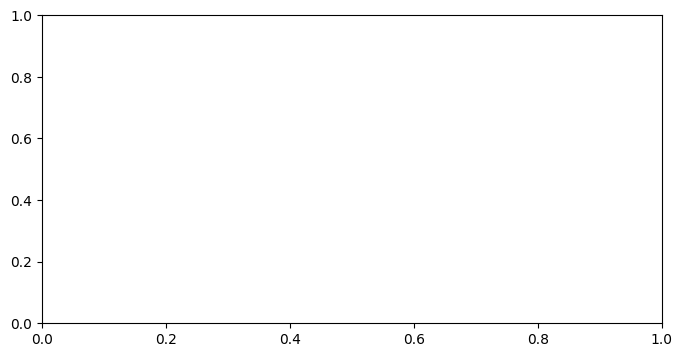

In [31]:
simple_plot_prediction(predictions.x, predictions.output, idx=2)


In [30]:
# encoder_target = predictions.x["encoder_target"].cpu().numpy()[idx]
print(predictions.x["encoder_target"][0])
print(predictions.x["encoder_target"][0].shape)

tensor([[0., 0., 1.,  ..., 0., 0., nan],
        [1., 1., 0.,  ..., 0., 0., nan],
        [0., 0., 0.,  ..., 0., 0., nan],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
torch.Size([1595, 9])


In [33]:
print(predictions.output.keys())
# print(predictions.output.prediction)

import numpy as np

# Extract tensor values
yerr = predictions.output.prediction.cpu().numpy()  # Move to CPU & convert to NumPy

# Count negative values
num_negative = np.sum(yerr < 0)
total_values = yerr.size
percentage_negative = (num_negative / total_values) * 100

print(f"Total values: {total_values}")
print(f"Negative values: {num_negative}")
print(f"Percentage of negative values: {percentage_negative:.2f}%")

('prediction', 'encoder_attention', 'decoder_attention', 'static_variables', 'encoder_variables', 'decoder_variables', 'decoder_lengths', 'encoder_lengths')


AttributeError: 'list' object has no attribute 'cpu'

In [40]:
import numpy as np

# Check for NaN or Inf
yerr = predictions.output.prediction.cpu().numpy()

print("Has NaN values?", np.isnan(yerr).any())
print("Has Inf values?", np.isinf(yerr).any())


AttributeError: 'list' object has no attribute 'prediction'

# Interpret Model

In [41]:
interpretation = best_tft.interpret_output(predictions.output, reduction="sum")
best_tft.plot_interpretation(interpretation)

TypeError: list indices must be integers or slices, not str

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir lightning_logs

In [44]:
# predictions = best_tft.predict(val_dataloader, return_x=True)
predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(predictions.x, predictions.output)
# best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals)

TypeError: only integer tensors of a single element can be converted to an index

In [31]:
predictions = best_tft.predict(val_dataloader, return_x=True)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


In [32]:
# predictions.output['prediction']
# predictions.x.keys()
predictions.x['decoder_target']

[tensor([[0],
         [1],
         [1],
         ...,
         [1],
         [0],
         [0]], device='cuda:0'),
 tensor([[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]], device='cuda:0'),
 tensor([[1],
         [0],
         [1],
         ...,
         [1],
         [0],
         [1]], device='cuda:0'),
 tensor([[0],
         [1],
         [0],
         ...,
         [0],
         [0],
         [1]], device='cuda:0'),
 tensor([[0],
         [1],
         [0],
         ...,
         [0],
         [1],
         [0]], device='cuda:0'),
 tensor([[1],
         [1],
         [1],
         ...,
         [1],
         [0],
         [1]], device='cuda:0'),
 tensor([[1],
         [1],
         [1],
         ...,
         [1],
         [1],
         [1]], device='cuda:0'),
 tensor([[1],
         [0],
         [1],
         ...,
         [0],
         [1],
         [1]], device='cuda:0'),
 tensor([[0],
         [0],
         [0],
         ...,
        

In [33]:
# This should return a list of tensors. Check the shape of one of them:
# print(predictions.output['prediction'][0].shape)        # Should ideally be [B, 1, 17]
print(predictions.output[0].shape)        # Should ideally be [B, 1, 17]
print(predictions.x['decoder_target'][0].shape)         # Should be [B, 1, 17] too
print(len(predictions.output['prediction']))        # Should ideally be [B, 1, 17]
print(len(predictions.x['decoder_target']))

torch.Size([1595, 1])
torch.Size([1595, 1])


TypeError: list indices must be integers or slices, not str

In [37]:
from sklearn.metrics import classification_report

all_reports = {}
target_names = training.target

# Go through each of the 17 binary classification tasks
for i in range(17):
    # Get predictions and apply sigmoid + threshold
    pred_tensor = predictions.output[i]  # shape: [B, 1, 1]
    prob_pred = torch.sigmoid(pred_tensor).squeeze()   # shape: [B]
    binary_pred = (prob_pred > 0.5).int().cpu()

    # Get targets and squeeze
    target_tensor = predictions.x['decoder_target'][i].squeeze().int().cpu()  # shape: [B]

    # Make sure both are 1D
    assert binary_pred.ndim == 1 and target_tensor.ndim == 1, f"Shape issue at target {i}"

    # classification report
    reportind = classification_report(target_tensor, binary_pred, digits=3)
    print(f"Classification Report for {target_names[i]}:")
    print(reportind)

Classification Report for INFECTIOUS_PARASITIC_DISEASES:
              precision    recall  f1-score   support

           0      0.735     0.808     0.770       872
           1      0.737     0.649     0.690       723

    accuracy                          0.736      1595
   macro avg      0.736     0.729     0.730      1595
weighted avg      0.736     0.736     0.734      1595

Classification Report for NEOPLASMS:
              precision    recall  f1-score   support

           0      0.824     1.000     0.904      1315
           1      0.000     0.000     0.000       280

    accuracy                          0.824      1595
   macro avg      0.412     0.500     0.452      1595
weighted avg      0.680     0.824     0.745      1595

Classification Report for ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES:
              precision    recall  f1-score   support

           0      0.552     0.248     0.342       323
           1      0.832     0.949     0.887      1272

    accuracy        

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report for MUSCULOSKELETAL_CONNECTIVE_TISSUE:
              precision    recall  f1-score   support

           0      0.779     0.999     0.875      1240
           1      0.750     0.008     0.017       355

    accuracy                          0.779      1595
   macro avg      0.764     0.504     0.446      1595
weighted avg      0.772     0.779     0.684      1595

Classification Report for CONGENITAL_ANOMALIES:
              precision    recall  f1-score   support

           0      0.977     1.000     0.989      1559
           1      0.000     0.000     0.000        36

    accuracy                          0.977      1595
   macro avg      0.489     0.500     0.494      1595
weighted avg      0.955     0.977     0.966      1595

Classification Report for PERINATAL_PERIOD:
              precision    recall  f1-score   support

           0      0.996     1.000     0.998      1588
           1      0.000     0.000     0.000         7

    accuracy                 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

In [38]:
from sklearn.metrics import classification_report

all_reports = {}
target_names = training.target

# Go through each of the 17 binary classification tasks
for i in range(17):
    # Get predictions and apply sigmoid + threshold
    pred_tensor = predictions.output[i]  # shape: [B, 1, 1]
    prob_pred = torch.sigmoid(pred_tensor).squeeze()   # shape: [B]
    binary_pred = (prob_pred > 0.5).int().cpu()

    # Get targets and squeeze
    target_tensor = predictions.x['decoder_target'][i].squeeze().int().cpu()  # shape: [B]

    # Make sure both are 1D
    assert binary_pred.ndim == 1 and target_tensor.ndim == 1, f"Shape issue at target {i}"

    # classification report
    report = classification_report(target_tensor, binary_pred, output_dict=True, zero_division=0)
    all_reports[f"{target_names[i]}"] = report

In [39]:
print(all_reports)

# for icd, report in all_reports.items():
#     print(f"{icd:6}: F1 = {report['1']['f1-score']:.2f}, Precision = {report['1']['precision']:.2f}, Recall = {report['1']['recall']:.2f}, Support = {report['1']['support']}")

for icd, report in all_reports.items():
    # Check if the '1' key exists before accessing it
    if '1' in report:
        print(f"{icd:6}: F1 = {report['1']['f1-score']:.2f}, Precision = {report['1']['precision']:.2f}, Recall = {report['1']['recall']:.2f}, Support = {report['1']['support']}")
    else:
        print(f"{icd:6}: No positive predictions or true values for this class.")

{'INFECTIOUS_PARASITIC_DISEASES': {'0': {'precision': 0.735140771637122, 'recall': 0.8084862385321101, 'f1-score': 0.7700709994538504, 'support': 872.0}, '1': {'precision': 0.7374213836477987, 'recall': 0.648686030428769, 'f1-score': 0.6902133922001472, 'support': 723.0}, 'accuracy': 0.7360501567398119, 'macro avg': {'precision': 0.7362810776424604, 'recall': 0.7285861344804396, 'f1-score': 0.7301421958269988, 'support': 1595.0}, 'weighted avg': {'precision': 0.7361745537585761, 'recall': 0.7360501567398119, 'f1-score': 0.7338722219965291, 'support': 1595.0}}, 'NEOPLASMS': {'0': {'precision': 0.8244514106583072, 'recall': 1.0, 'f1-score': 0.9037800687285223, 'support': 1315.0}, '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 280.0}, 'accuracy': 0.8244514106583072, 'macro avg': {'precision': 0.4122257053291536, 'recall': 0.5, 'f1-score': 0.4518900343642612, 'support': 1595.0}, 'weighted avg': {'precision': 0.6797201285364727, 'recall': 0.8244514106583072, 'f1-score': 

In [ ]:
all_reports

In [40]:
# all_reports['ICD_10']
all_reports

{'INFECTIOUS_PARASITIC_DISEASES': {'0': {'precision': 0.735140771637122,
   'recall': 0.8084862385321101,
   'f1-score': 0.7700709994538504,
   'support': 872.0},
  '1': {'precision': 0.7374213836477987,
   'recall': 0.648686030428769,
   'f1-score': 0.6902133922001472,
   'support': 723.0},
  'accuracy': 0.7360501567398119,
  'macro avg': {'precision': 0.7362810776424604,
   'recall': 0.7285861344804396,
   'f1-score': 0.7301421958269988,
   'support': 1595.0},
  'weighted avg': {'precision': 0.7361745537585761,
   'recall': 0.7360501567398119,
   'f1-score': 0.7338722219965291,
   'support': 1595.0}},
 'NEOPLASMS': {'0': {'precision': 0.8244514106583072,
   'recall': 1.0,
   'f1-score': 0.9037800687285223,
   'support': 1315.0},
  '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 280.0},
  'accuracy': 0.8244514106583072,
  'macro avg': {'precision': 0.4122257053291536,
   'recall': 0.5,
   'f1-score': 0.4518900343642612,
   'support': 1595.0},
  'weighted avg': {'pre

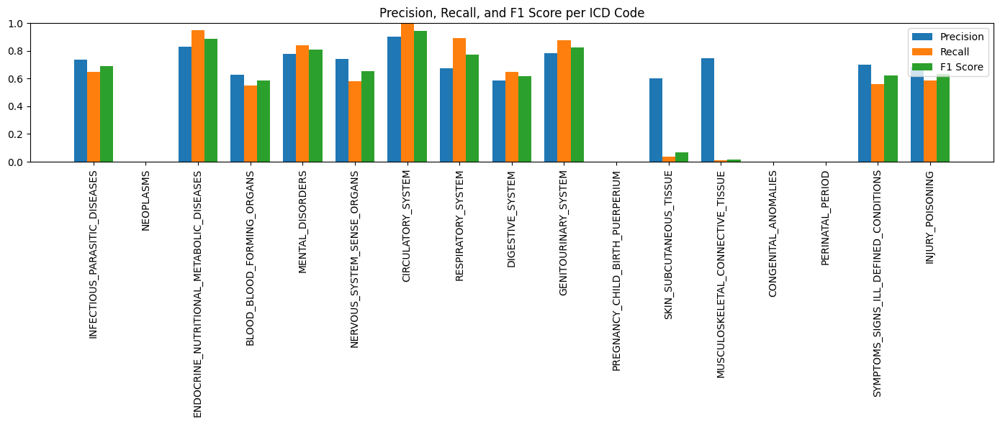

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np

# Assuming all_reports was built like in the previous message
f1_scores = []
precision_scores = []
recall_scores = []

for name in target_names:
    report = all_reports[name]
    # f1_scores.append(report['1']['f1-score'])
    # precision_scores.append(report['1']['precision'])
    # recall_scores.append(report['1']['recall'])
     # Check if the '1' key exists before accessing it
    if '1' in report:
        f1_scores.append(report['1']['f1-score'])
        precision_scores.append(report['1']['precision'])
        recall_scores.append(report['1']['recall'])
    else:
        # If '1' key is missing, append 0 or NaN (depending on your preference)
        f1_scores.append(0)  # Or np.nan
        precision_scores.append(0)  # Or np.nan
        recall_scores.append(0)  # Or np.nan

# --- BAR CHART ---
x = np.arange(len(target_names))
width = 0.25

plt.figure(figsize=(14, 6))
plt.bar(x - width, precision_scores, width, label='Precision')
plt.bar(x, recall_scores, width, label='Recall')
plt.bar(x + width, f1_scores, width, label='F1 Score')
plt.xticks(x, target_names, rotation=90)
plt.ylim(0, 1.0)
plt.title('Precision, Recall, and F1 Score per ICD Code')
plt.legend()
plt.tight_layout()
plt.show()


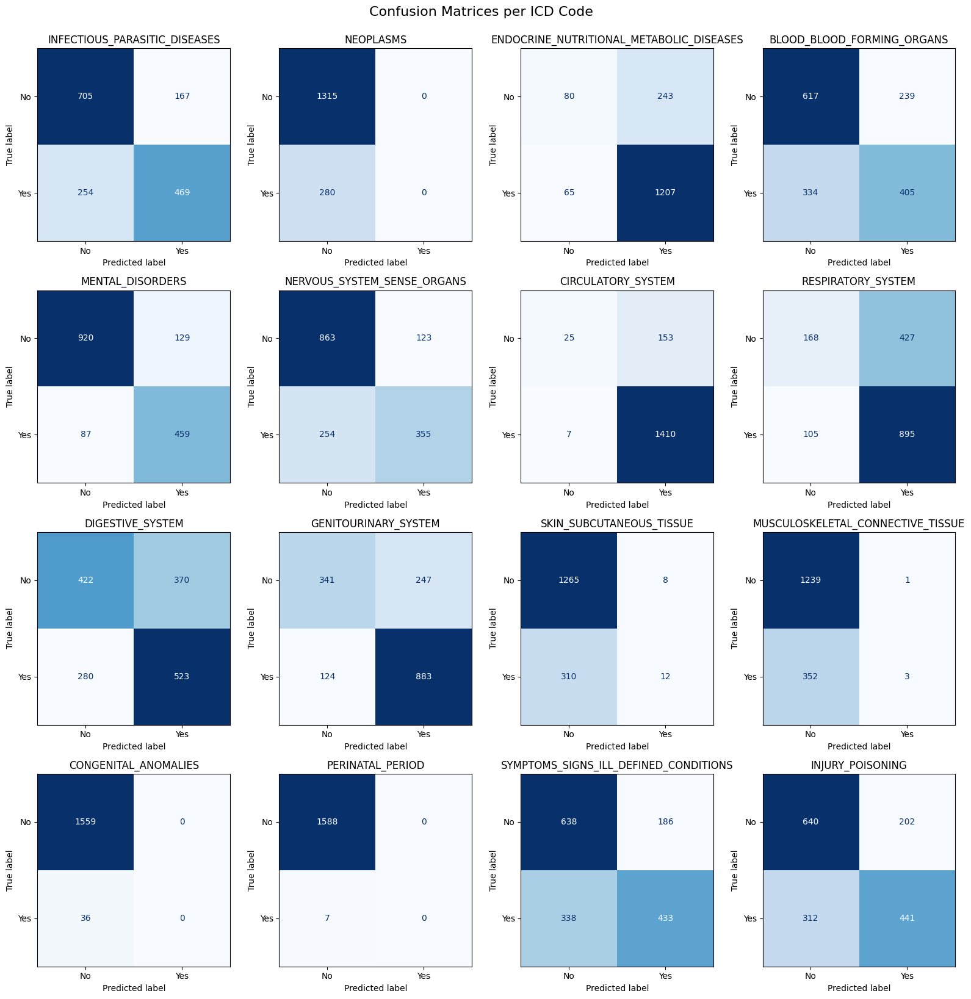

In [42]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# num_targets = len(target_names)
# rows = (num_targets + cols - 1) // cols
cols = 4  # Customize this: how many confusion matrices per row
rows = 4

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
axes = axes.flatten()  # To easily iterate over axes

ax_num = 0

for i, name in enumerate(target_names):
  if name == 'PREGNANCY_CHILD_BIRTH_PUERPERIUM':
    continue
  pred_tensor = predictions.output[i]
  prob_pred = torch.sigmoid(pred_tensor).squeeze()
  binary_pred = (prob_pred > 0.5).int().cpu()

  target_tensor = predictions.x['decoder_target'][i].squeeze().int().cpu()

  cm = confusion_matrix(target_tensor, binary_pred)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No", "Yes"])
  disp.plot(ax=axes[ax_num], cmap="Blues", colorbar=False)
  axes[ax_num].set_title(name)
  ax_num += 1

# Hide unused subplots (in case of uneven grid)
for j in range(i + 1, len(axes)):
  fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Confusion Matrices per ICD Code", fontsize=16, y=1.02)
plt.show()


In [43]:
predictions = best_tft.predict(val_dataloader, return_x=True)

x = predictions.x
y = predictions.output
for ls in y:
  ls = ls.type(torch.float32)
for ls in x['decoder_target']:
  ls = ls.type(torch.float32)

# drop everything other than the first list of y
# y = y[0]
# x['decoder_target'] = x['decoder_target'][0]

predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(x, y)
best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


TypeError: only integer tensors of a single element can be converted to an index

In [ ]:
print(type(y[0]))
print(len(x['encoder_target']))
print(len(x['decoder_target']))
print(x.keys())

In [ ]:
# predictions = best_tft.predict(val_dataloader, return_x=True)
# # Iterate through the values in predictions.x and convert to float if they are tensors
# for key, value in predictions.x.items():
#     if isinstance(value, torch.Tensor):
#         predictions.x[key] = value.float()

# # Convert the predictions.output tensor to float values
# if isinstance(predictions.output, torch.Tensor):
#     predictions.output = predictions.output.float()

# predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(predictions.x, predictions.output)
# best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals)

In [ ]:
# predictions = best_tft.predict(val_dataloader, return_x=True)
# # Iterate through the values in predictions.x and convert to float if they are tensors
# for key, value in predictions.x.items():
#     if isinstance(value, torch.Tensor):
#         predictions.x[key] = value.float()

# # Instead of trying to set the output attribute, create a new dictionary with the modified output
# new_output = predictions.output.float() if isinstance(predictions.output, torch.Tensor) else predictions.output
# # use this new dictionary when calculating and plotting prediction_actual_by_variable
# predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(predictions.x, new_output)
# best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals)

In [ ]:
!pwd

# Save the Best Model

In [44]:
torch.save(best_tft.state_dict(), '/Best_tft_model.pth')

In [45]:
new_tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate= learning_rate,
    hidden_size= hidden_size,
    attention_head_size= attention_head_size,

    hidden_continuous_size= hidden_continuous_size,
    # loss=QuantileLoss(),
    # loss=CrossEntropy(),                            # FOR CLASSIFICATION
    loss=MultiLoss(metrics=[CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy(), CrossEntropy()]),                            # FOR MULTI LABEL CLASSIFICATION
    # log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    optimizer="AdamW",
    reduce_on_plateau_patience=1,
    lstm_layers= lstm_layers,
    dropout= dropout,
)

/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


In [46]:
new_tft.load_state_dict(torch.load('/Best_tft_model.pth'))

<All keys matched successfully>

In [47]:
#set the model in the evaluation mode
new_tft.eval()

TemporalFusionTransformer(
  	"attention_head_size":               1
  	"categorical_groups":                {}
  	"causal_attention":                  True
  	"dataset_parameters":                {'time_idx': 'time_idx', 'target': ['INFECTIOUS_PARASITIC_DISEASES', 'NEOPLASMS', 'ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES', 'BLOOD_BLOOD_FORMING_ORGANS', 'MENTAL_DISORDERS', 'NERVOUS_SYSTEM_SENSE_ORGANS', 'CIRCULATORY_SYSTEM', 'RESPIRATORY_SYSTEM', 'DIGESTIVE_SYSTEM', 'GENITOURINARY_SYSTEM', 'PREGNANCY_CHILD_BIRTH_PUERPERIUM', 'SKIN_SUBCUTANEOUS_TISSUE', 'MUSCULOSKELETAL_CONNECTIVE_TISSUE', 'CONGENITAL_ANOMALIES', 'PERINATAL_PERIOD', 'SYMPTOMS_SIGNS_ILL_DEFINED_CONDITIONS', 'INJURY_POISONING'], 'group_ids': ['SUBJECT_ID'], 'weight': None, 'max_encoder_length': 10, 'min_encoder_length': 1, 'min_prediction_idx': 1, 'min_prediction_length': 1, 'max_prediction_length': 1, 'static_categoricals': ['SUBJECT_ID'], 'static_reals': ['Day', 'Month', 'Year', 'GENDER'], 'time_varying_known_categoricals'

In [48]:
predictions = new_tft.predict(val_dataloader, return_x=True, mode="raw")
# predictions = new_tft.predict(val_dataloader, return_x=True)
# predictions = new_tft.predict(val_dataloader, return_x=True, return_y=True)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/dist-packages/pytorch_forecasting/models/base_model.py:121: UserWarning: Not all dimensions are equal for tensors shapes. Example tensor torch.Size([320, 1, 1, 8]). Returning list instead of torch.Tensor.
  warnings.warn(


In [49]:
predictions.keys()

('output', 'x', 'index', 'decoder_lengths', 'y')

In [50]:
print((predictions.output['prediction'][0][0]))

tensor([[ 0.9064, -0.3706]], device='cuda:0')


In [36]:
# z = predictions.output
# print(z.shape)
# print(z)

In [37]:
# new_tft.plot_prediction(predictions.y, predictions.output, idx=1, add_loss_to_title=True)

In [74]:
predictions = best_tft.predict(val_dataloader, return_x=True)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [75]:
from sklearn.metrics import accuracy_score

# Initialize lists to collect all predictions and targets
all_preds = []
all_targets = []

for i in range(17):
    pred_tensor = predictions.output[i]
    prob_pred = torch.sigmoid(pred_tensor).squeeze()
    binary_pred = (prob_pred > 0.5).int().cpu()

    target_tensor = predictions.x['decoder_target'][i].squeeze().int().cpu()

    assert binary_pred.ndim == 1 and target_tensor.ndim == 1, f"Shape issue at target {i}"

    # Append to global lists
    all_preds.extend(binary_pred.tolist())
    all_targets.extend(target_tensor.tolist())

# Compute overall accuracy across all classes and samples
overall_accuracy = accuracy_score(all_targets, all_preds)
print(f"\nOverall Multi-label Accuracy: {overall_accuracy:.3f}")



Overall Multi-label Accuracy: 0.792


In [52]:
from sklearn.metrics import classification_report

all_reports = {}
target_names = training.target

# Go through each of the 17 binary classification tasks
for i in range(17):
    # Get predictions and apply sigmoid + threshold
    pred_tensor = predictions.output[i]  # shape: [B, 1, 1]
    prob_pred = torch.sigmoid(pred_tensor).squeeze()   # shape: [B]
    binary_pred = (prob_pred > 0.5).int().cpu()

    # Get targets and squeeze
    target_tensor = predictions.x['decoder_target'][i].squeeze().int().cpu()  # shape: [B]

    # Make sure both are 1D
    assert binary_pred.ndim == 1 and target_tensor.ndim == 1, f"Shape issue at target {i}"

    # classification report
    reportind = classification_report(target_tensor, binary_pred, digits=3)
    print(f"Classification Report for {target_names[i]}:")
    print(reportind)

Classification Report for INFECTIOUS_PARASITIC_DISEASES:
              precision    recall  f1-score   support

           0      0.735     0.808     0.770       872
           1      0.737     0.649     0.690       723

    accuracy                          0.736      1595
   macro avg      0.736     0.729     0.730      1595
weighted avg      0.736     0.736     0.734      1595

Classification Report for NEOPLASMS:
              precision    recall  f1-score   support

           0      0.824     1.000     0.904      1315
           1      0.000     0.000     0.000       280

    accuracy                          0.824      1595
   macro avg      0.412     0.500     0.452      1595
weighted avg      0.680     0.824     0.745      1595

Classification Report for ENDOCRINE_NUTRITIONAL_METABOLIC_DISEASES:
              precision    recall  f1-score   support

           0      0.552     0.248     0.342       323
           1      0.832     0.949     0.887      1272

    accuracy        

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

In [53]:
from sklearn.metrics import classification_report

all_reports = {}
target_names = training.target

# Go through each of the 17 binary classification tasks
for i in range(17):
    # Get predictions and apply sigmoid + threshold
    pred_tensor = predictions.output[i]  # shape: [B, 1, 1]
    prob_pred = torch.sigmoid(pred_tensor).squeeze()   # shape: [B]
    binary_pred = (prob_pred > 0.5).int().cpu()

    # Get targets and squeeze
    target_tensor = predictions.x['decoder_target'][i].squeeze().int().cpu()  # shape: [B]

    # Make sure both are 1D
    assert binary_pred.ndim == 1 and target_tensor.ndim == 1, f"Shape issue at target {i}"

    # classification report
    report = classification_report(target_tensor, binary_pred, output_dict=True, zero_division=0)
    all_reports[f"{target_names[i]}"] = report

In [54]:
print(all_reports)

# for icd, report in all_reports.items():
#     print(f"{icd:6}: F1 = {report['1']['f1-score']:.2f}, Precision = {report['1']['precision']:.2f}, Recall = {report['1']['recall']:.2f}, Support = {report['1']['support']}")

for icd, report in all_reports.items():
    # Check if the '1' key exists before accessing it
    if '1' in report:
        print(f"{icd:6}: F1 = {report['1']['f1-score']:.2f}, Precision = {report['1']['precision']:.2f}, Recall = {report['1']['recall']:.2f}, Support = {report['1']['support']}")
    else:
        print(f"{icd:6}: No positive predictions or true values for this class.")

{'INFECTIOUS_PARASITIC_DISEASES': {'0': {'precision': 0.735140771637122, 'recall': 0.8084862385321101, 'f1-score': 0.7700709994538504, 'support': 872.0}, '1': {'precision': 0.7374213836477987, 'recall': 0.648686030428769, 'f1-score': 0.6902133922001472, 'support': 723.0}, 'accuracy': 0.7360501567398119, 'macro avg': {'precision': 0.7362810776424604, 'recall': 0.7285861344804396, 'f1-score': 0.7301421958269988, 'support': 1595.0}, 'weighted avg': {'precision': 0.7361745537585761, 'recall': 0.7360501567398119, 'f1-score': 0.7338722219965291, 'support': 1595.0}}, 'NEOPLASMS': {'0': {'precision': 0.8244514106583072, 'recall': 1.0, 'f1-score': 0.9037800687285223, 'support': 1315.0}, '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 280.0}, 'accuracy': 0.8244514106583072, 'macro avg': {'precision': 0.4122257053291536, 'recall': 0.5, 'f1-score': 0.4518900343642612, 'support': 1595.0}, 'weighted avg': {'precision': 0.6797201285364727, 'recall': 0.8244514106583072, 'f1-score': 

In [55]:
all_reports

{'INFECTIOUS_PARASITIC_DISEASES': {'0': {'precision': 0.735140771637122,
   'recall': 0.8084862385321101,
   'f1-score': 0.7700709994538504,
   'support': 872.0},
  '1': {'precision': 0.7374213836477987,
   'recall': 0.648686030428769,
   'f1-score': 0.6902133922001472,
   'support': 723.0},
  'accuracy': 0.7360501567398119,
  'macro avg': {'precision': 0.7362810776424604,
   'recall': 0.7285861344804396,
   'f1-score': 0.7301421958269988,
   'support': 1595.0},
  'weighted avg': {'precision': 0.7361745537585761,
   'recall': 0.7360501567398119,
   'f1-score': 0.7338722219965291,
   'support': 1595.0}},
 'NEOPLASMS': {'0': {'precision': 0.8244514106583072,
   'recall': 1.0,
   'f1-score': 0.9037800687285223,
   'support': 1315.0},
  '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 280.0},
  'accuracy': 0.8244514106583072,
  'macro avg': {'precision': 0.4122257053291536,
   'recall': 0.5,
   'f1-score': 0.4518900343642612,
   'support': 1595.0},
  'weighted avg': {'pre

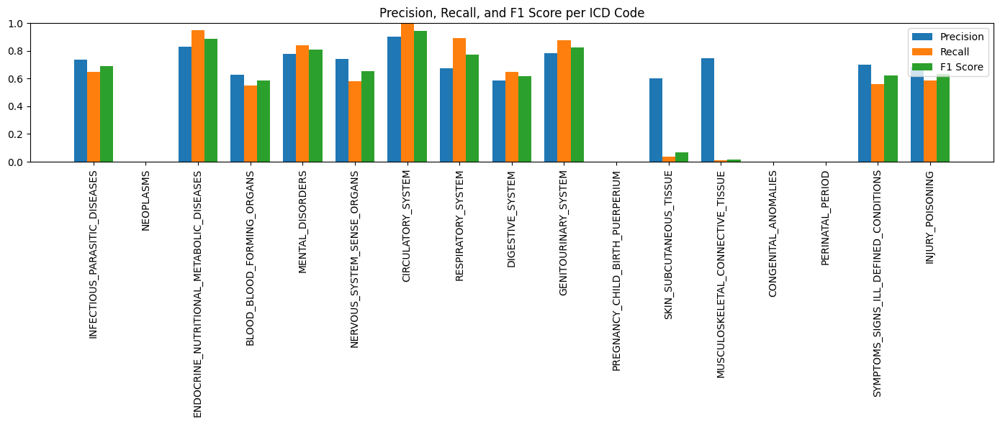

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np

# Assuming all_reports was built like in the previous message
f1_scores = []
precision_scores = []
recall_scores = []

for name in target_names:
    report = all_reports[name]
    # f1_scores.append(report['1']['f1-score'])
    # precision_scores.append(report['1']['precision'])
    # recall_scores.append(report['1']['recall'])
     # Check if the '1' key exists before accessing it
    if '1' in report:
        f1_scores.append(report['1']['f1-score'])
        precision_scores.append(report['1']['precision'])
        recall_scores.append(report['1']['recall'])
    else:
        # If '1' key is missing, append 0 or NaN (depending on your preference)
        f1_scores.append(0)  # Or np.nan
        precision_scores.append(0)  # Or np.nan
        recall_scores.append(0)  # Or np.nan

# --- BAR CHART ---
x = np.arange(len(target_names))
width = 0.25

plt.figure(figsize=(14, 6))
plt.bar(x - width, precision_scores, width, label='Precision')
plt.bar(x, recall_scores, width, label='Recall')
plt.bar(x + width, f1_scores, width, label='F1 Score')
plt.xticks(x, target_names, rotation=90)
plt.ylim(0, 1.0)
plt.title('Precision, Recall, and F1 Score per ICD Code')
plt.legend()
plt.tight_layout()
plt.show()


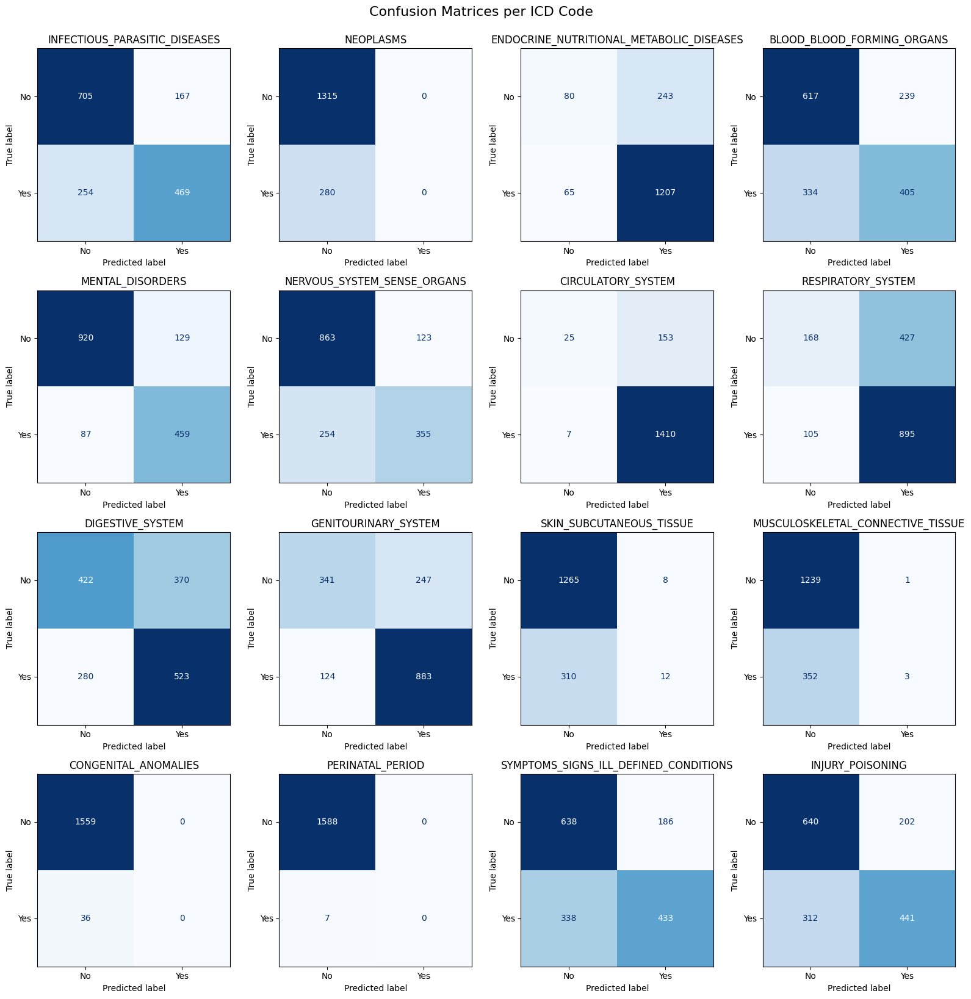

In [57]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# num_targets = len(target_names)
# rows = (num_targets + cols - 1) // cols
cols = 4  # Customize this: how many confusion matrices per row
rows = 4

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
axes = axes.flatten()  # To easily iterate over axes

ax_num = 0

for i, name in enumerate(target_names):
  if name == 'PREGNANCY_CHILD_BIRTH_PUERPERIUM':
    continue
  pred_tensor = predictions.output[i]
  prob_pred = torch.sigmoid(pred_tensor).squeeze()
  binary_pred = (prob_pred > 0.5).int().cpu()

  target_tensor = predictions.x['decoder_target'][i].squeeze().int().cpu()

  cm = confusion_matrix(target_tensor, binary_pred)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No", "Yes"])
  disp.plot(ax=axes[ax_num], cmap="Blues", colorbar=False)
  axes[ax_num].set_title(name)
  ax_num += 1

# Hide unused subplots (in case of uneven grid)
for j in range(i + 1, len(axes)):
  fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Confusion Matrices per ICD Code", fontsize=16, y=1.02)
plt.show()


In [58]:
predictions = best_tft.predict(val_dataloader, return_x=True, mode='raw')

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pytorch_forecasting/models/base_model.py:121: UserWarning: Not all dimensions are equal for tensors shapes. Example tensor torch.Size([320, 1, 1, 8]). Returning list instead of torch.Tensor.
  warnings.warn(


In [95]:
# print(predictions.output['prediction'][0].shape)
print(predictions.x['encoder_target'])

[tensor([[0., 0., 1.,  ..., 0., 0., nan],
        [1., 1., 0.,  ..., 0., 0., nan],
        [0., 0., 0.,  ..., 0., 0., nan],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0'), tensor([[1., 0., 0.,  ..., 0., 0., nan],
        [0., 1., 0.,  ..., 0., 0., nan],
        [0., 0., 0.,  ..., 0., 0., nan],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0'), tensor([[1., 0., 0.,  ..., 0., 0., nan],
        [1., 1., 0.,  ..., 0., 0., nan],
        [0., 0., 0.,  ..., 0., 0., nan],
        ...,
        [0., 1., 0.,  ..., 0., 0., 0.],
        [0., 1., 0.,  ..., 0., 0., 0.],
        [1., 1., 0.,  ..., 0., 0., 0.]], device='cuda:0'), tensor([[0., 1., 1.,  ..., 0., 0., nan],
        [1., 0., 0.,  ..., 0., 0., nan],
        [0., 0., 1.,  ..., 0., 0., nan],
        ...,
        [0., 1., 0.,  ..., 0., 0., 0.]

In [60]:
import torch
import torch.nn.functional as F
from sklearn.metrics import roc_auc_score, average_precision_score, RocCurveDisplay, PrecisionRecallDisplay
import numpy as np
import matplotlib.pyplot as plt

# Initialize lists for true and predicted values (for micro-average)
micro_y_true = []
micro_y_score = []

# Also keep per-class AUROCs and AUPRCs for macro-average
all_aurocs = []
all_auprcs = []

# For plotting one AUROC/AUPRC curve per class
roc_curves = []
pr_curves = []

for class_idx in range(17):
    # Get prediction logits and targets
    logits = predictions.output['prediction'][class_idx].squeeze(1)  # [batch_size, 2]
    targets = predictions.x['decoder_target'][class_idx][:, -1]      # [batch_size]

    # Convert logits to probabilities
    probs = F.softmax(logits, dim=1)[:, 1]  # positive class probs

    # Filter NaNs
    mask = ~torch.isnan(targets)
    y_true = targets[mask].cpu().numpy().astype(int)
    y_score = probs[mask].detach().cpu().numpy()

    if len(np.unique(y_true)) < 2:
        continue  # skip if only one class present

    # Save for micro-average
    micro_y_true.extend(y_true)
    micro_y_score.extend(y_score)

    # AUROC & AUPRC
    auroc = roc_auc_score(y_true, y_score)
    auprc = average_precision_score(y_true, y_score)
    all_aurocs.append(auroc)
    all_auprcs.append(auprc)

    # Store for plotting
    roc_curves.append((y_true, y_score))
    pr_curves.append((y_true, y_score))

# === Final Scores ===
macro_auroc = np.mean(all_aurocs)
macro_auprc = np.mean(all_auprcs)

micro_auroc = roc_auc_score(micro_y_true, micro_y_score)
micro_auprc = average_precision_score(micro_y_true, micro_y_score)

print(f"Macro AUROC: {macro_auroc:.4f}")
print(f"Macro AUPRC: {macro_auprc:.4f}")
print(f"Micro AUROC: {micro_auroc:.4f}")
print(f"Micro AUPRC: {micro_auprc:.4f}")

Macro AUROC: 0.7614
Macro AUPRC: 0.6257
Micro AUROC: 0.8630
Micro AUPRC: 0.8241


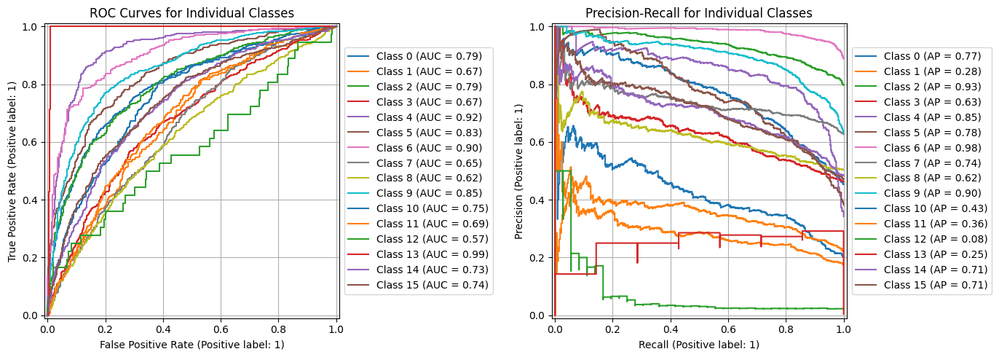

In [73]:
# Plot a few representative ROC curves
plt.figure(figsize=(14, 5))

# ROC Curve
plt.subplot(1, 2, 1)
for i, (y_true, y_score) in enumerate(roc_curves[:17]):  # show first 5 classes
    RocCurveDisplay.from_predictions(y_true, y_score, name=f"Class {i}", ax=plt.gca())
plt.title("ROC Curves for Individual Classes")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.grid(True)


# PR Curve
plt.subplot(1, 2, 2)
for i, (y_true, y_score) in enumerate(pr_curves[:17]):  # show first 5 classes
    PrecisionRecallDisplay.from_predictions(y_true, y_score, name=f"Class {i}", ax=plt.gca())
plt.title("Precision-Recall for Individual Classes")
plt.grid(True)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

plt.tight_layout()
plt.show()

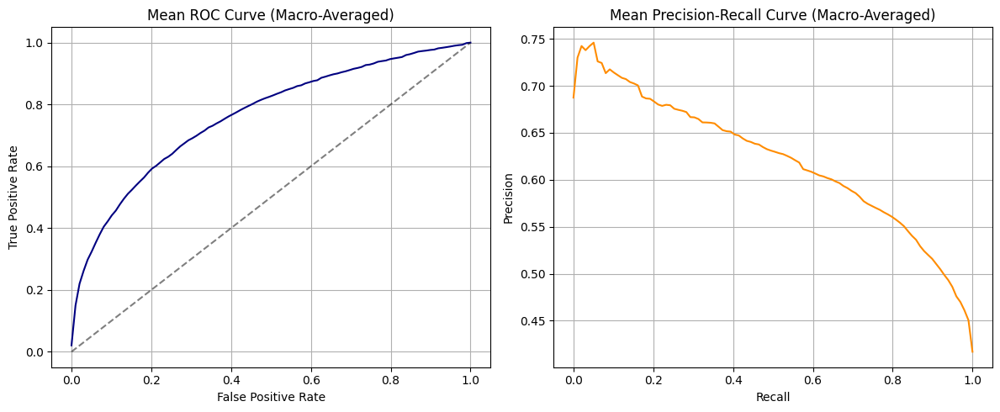

In [68]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, precision_recall_curve

# Setup common axis for interpolation
fpr_common = np.linspace(0, 1, 100)
recall_common = np.linspace(0, 1, 100)

# Store interpolated values for averaging
tpr_all = []
precision_all = []

for y_true, y_score in roc_curves:  # from earlier loop
    # ROC Curve
    fpr, tpr, _ = roc_curve(y_true, y_score)
    tpr_interp = np.interp(fpr_common, fpr, tpr)
    tpr_all.append(tpr_interp)

for y_true, y_score in pr_curves:  # from earlier loop
    # PR Curve
    precision, recall, _ = precision_recall_curve(y_true, y_score)
    precision_interp = np.interp(recall_common, recall[::-1], precision[::-1])  # Reverse for monotonicity
    precision_all.append(precision_interp)

# Compute mean curves
mean_tpr = np.mean(tpr_all, axis=0)
mean_precision = np.mean(precision_all, axis=0)

# Plot
plt.figure(figsize=(12, 5))

# Mean ROC
plt.subplot(1, 2, 1)
plt.plot(fpr_common, mean_tpr, label="Mean ROC (macro)", color='navy')
plt.plot([0, 1], [0, 1], 'k--', alpha=0.5)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Mean ROC Curve (Macro-Averaged)")
plt.grid(True)

# Mean PR
plt.subplot(1, 2, 2)
plt.plot(recall_common, mean_precision, label="Mean PR (macro)", color='darkorange')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Mean Precision-Recall Curve (Macro-Averaged)")
plt.grid(True)

plt.tight_layout()
plt.show()


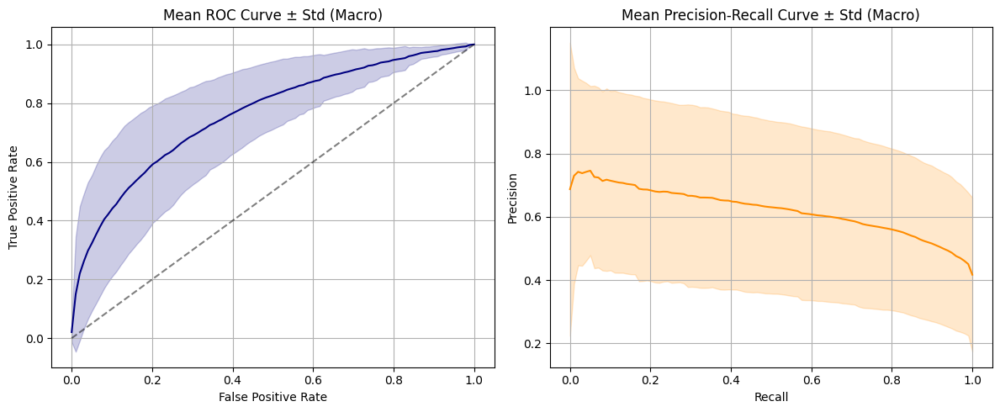

In [69]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, precision_recall_curve

# Define common axes
fpr_common = np.linspace(0, 1, 100)
recall_common = np.linspace(0, 1, 100)

# Store interpolated curves
tpr_all = []
precision_all = []

# Interpolate ROC and PR curves to common axis
for y_true, y_score in roc_curves:
    fpr, tpr, _ = roc_curve(y_true, y_score)
    tpr_interp = np.interp(fpr_common, fpr, tpr)
    tpr_all.append(tpr_interp)

for y_true, y_score in pr_curves:
    precision, recall, _ = precision_recall_curve(y_true, y_score)
    precision_interp = np.interp(recall_common, recall[::-1], precision[::-1])
    precision_all.append(precision_interp)

# Convert to arrays for easy stats
tpr_all = np.array(tpr_all)
precision_all = np.array(precision_all)

# Mean and std
mean_tpr = np.mean(tpr_all, axis=0)
std_tpr = np.std(tpr_all, axis=0)

mean_precision = np.mean(precision_all, axis=0)
std_precision = np.std(precision_all, axis=0)

# Plot
plt.figure(figsize=(12, 5))

# === ROC Curve with std ===
plt.subplot(1, 2, 1)
plt.plot(fpr_common, mean_tpr, label="Mean ROC (macro)", color='navy')
plt.fill_between(fpr_common, mean_tpr - std_tpr, mean_tpr + std_tpr, color='navy', alpha=0.2)
plt.plot([0, 1], [0, 1], 'k--', alpha=0.5)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Mean ROC Curve ± Std (Macro)")
plt.grid(True)

# === PR Curve with std ===
plt.subplot(1, 2, 2)
plt.plot(recall_common, mean_precision, label="Mean PR (macro)", color='darkorange')
plt.fill_between(recall_common, mean_precision - std_precision, mean_precision + std_precision, color='darkorange', alpha=0.2)
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Mean Precision-Recall Curve ± Std (Macro)")
plt.grid(True)

plt.tight_layout()
plt.show()


In [76]:
for class_idx in range(17):
    targets = predictions.x['decoder_target'][class_idx][:, -1]
    mask = ~torch.isnan(targets)
    y_true = targets[mask].cpu().numpy().astype(int)
    print(f"Class {class_idx}: Positive samples = {sum(y_true)}, Total = {len(y_true)}")


Class 0: Positive samples = 723, Total = 1595
Class 1: Positive samples = 280, Total = 1595
Class 2: Positive samples = 1272, Total = 1595
Class 3: Positive samples = 739, Total = 1595
Class 4: Positive samples = 546, Total = 1595
Class 5: Positive samples = 609, Total = 1595
Class 6: Positive samples = 1417, Total = 1595
Class 7: Positive samples = 1000, Total = 1595
Class 8: Positive samples = 803, Total = 1595
Class 9: Positive samples = 1007, Total = 1595
Class 10: Positive samples = 0, Total = 1595
Class 11: Positive samples = 322, Total = 1595
Class 12: Positive samples = 355, Total = 1595
Class 13: Positive samples = 36, Total = 1595
Class 14: Positive samples = 7, Total = 1595
Class 15: Positive samples = 771, Total = 1595
Class 16: Positive samples = 753, Total = 1595


In [77]:
from sklearn.metrics import f1_score
macro_f1 = f1_score(micro_y_true, [int(p > 0.5) for p in micro_y_score], average='macro')
print(f"Macro F1-score: {macro_f1:.4f}")


Macro F1-score: 0.7706


In [78]:
from sklearn.metrics import precision_recall_fscore_support

# Collect all predictions and targets
all_preds = []
all_targets = []

for i in range(17):
    pred_tensor = predictions.output[i]
    prob_pred = torch.sigmoid(pred_tensor).squeeze()
    binary_pred = (prob_pred > 0.5).int().cpu()

    target_tensor = predictions.x['decoder_target'][i].squeeze().int().cpu()

    all_preds.extend(binary_pred.tolist())
    all_targets.extend(target_tensor.tolist())

# Compute all metrics with sklearn
precision_micro, recall_micro, f1_micro, _ = precision_recall_fscore_support(
    all_targets, all_preds, average='micro'
)
precision_macro, recall_macro, f1_macro, _ = precision_recall_fscore_support(
    all_targets, all_preds, average='macro'
)
precision_weighted, recall_weighted, f1_weighted, _ = precision_recall_fscore_support(
    all_targets, all_preds, average='weighted'
)

print(f"Micro Precision: {precision_micro:.3f}, Recall: {recall_micro:.3f}, F1: {f1_micro:.3f}")
print(f"Macro Precision: {precision_macro:.3f}, Recall: {recall_macro:.3f}, F1: {f1_macro:.3f}")
print(f"Weighted Precision: {precision_weighted:.3f}, Recall: {recall_weighted:.3f}, F1: {f1_weighted:.3f}")


Micro Precision: 0.792, Recall: 0.792, F1: 0.792
Macro Precision: 0.783, Recall: 0.776, F1: 0.779
Weighted Precision: 0.790, Recall: 0.792, F1: 0.791
